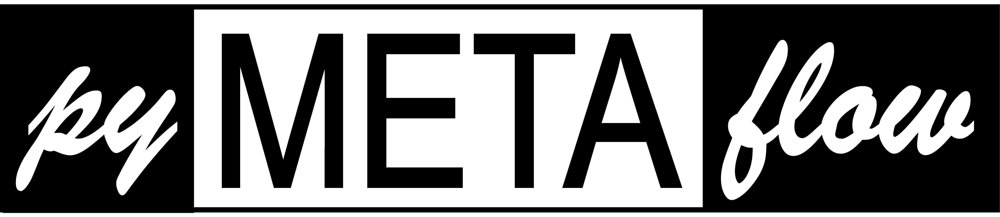

## pyMETAflow for LC-UV Data

This notebook provides a comprehensive workflow for processing, analyzing, and comparing LC(UV) metabolomics data. The goal is to transform raw LC data into meaningful information about sample composition and, if applicable, its relationship with final biological activity.

---

### The full process encompasses the following key steps:


#### 1. Data Import and Preprocessing

- **Description:**  
  Raw LC(UV) data files (e.g., in `.txt` format) are converted to CSV format and combined into a single dataset.
   
  - Apply retention time filtering to remove unwanted regions.
  - Exclude specific samples (such as known standards or interfering compounds) based on metadata.



#### 2. Chromatogram Visualization and Peak Detection

- **Description:**  
  Chromatograms are plotted in both overlapping and stacked formats to inspect signal profiles.
  
  - Use peak detection algorithms to identify key spectral features.
  - Quantify metrics such as the number of detected peaks.



#### 3. Data Alignment

- **Description:**  
  Slight variations in retention times between runs are corrected through alignment.
  
  - Employ methods like iCOshift, RAFFT, and PAFFT to ensure consistent alignment of spectral features across samples.



#### 4. Normalization and Scaling

- **Description:**  
  The dataset undergoes normalization to correct for systematic variations, followed by scaling to standardize the data.
  
  - Apply normalization methods such as Z-score, PQN, or control-based normalization.
  - Use scaling methods like mean-centering, auto-scaling, and Pareto scaling for downstream multivariate analysis.



#### 5. Multivariate Statistical Analysis

- **Description:**  
  Unsupervised (PCA) and supervised (PLS-DA) techniques are applied to extract patterns and classify samples.
  
  - Identify the major sources of variation.
  - Highlight important variables driving group separations.



#### 6. Data Fusion and STOCSY Analysis

- **Description:**  
  LC(UV) data is integrated with bioactivity data to create a holistic view of sample characteristics.
  
  - Use data fusion techniques to merge datasets.
  - Apply STOCSY analysis to reveal correlations between spectral features and uncover chemically related compounds or biomarkers.



#### 7. Data Export

- **Description:**  
  The final processed and fused data is exported for further analysis.
  
  - Save the data in a format suitable for tools like MetaboAnalyst.
  - Facilitate in-depth statistical evaluations and reporting.


In [1]:
# Import essential libraries
import os
import os.path
import glob
import sys
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.cross_decomposition import PLSRegression
from sklearn.model_selection import cross_val_predict
from sklearn.metrics import accuracy_score, classification_report
import seaborn as sns

import plotly.io as pio
import plotly.graph_objects as go
from io import StringIO

# Adiciona o diretório pai ao sys.path
sys.path.insert(0, os.path.abspath('..'))
import data_processing_HPLC as dp

#### Select data directory and import data

Data Import and Processing

    1. Reads .txt files, extracts retention time and intensity data, and converts them to .csv.
    2. Combines all .csv files into a single dataset.
    3. Filters retention times to remove unwanted regions.

In [2]:
directory_path = %pwd # identifies the current folder

# Import data
input_folder = directory_path
output_folder = os.path.join(input_folder, 'data')
%pwd

'C:\\Users\\NPPN\\Documents\\pyMETAflow_HPLC\\Edgar'

#### Convert datafiles into a single dataframe

In [3]:
# Execute for specific wavelength
selected_wavelength = 254

combined_df = dp.import_3D_data(input_folder, 
                                    target_wavelength=selected_wavelength)

📂 Processing 12 files...


🔄 Importing: 100%|█████████████████████████████| 12/12 [00:01<00:00,  7.70it/s]

✅ Combined file saved to: C:\Users\NPPN\Documents\pyMETAflow_HPLC\Edgar\data\combined_wavelength_data.csv


In [4]:
# Create the Target Vector for the supervision tool (PLS-DA)
df_metadata = pd.read_csv("Metadata.csv", sep=";")
#df_metadata

# Create the mapping: {old_name: new_name}
mapping = dict(zip(df_metadata["ASCII_filename"], df_metadata["HPLC_filename"]))

# Rename the columns in combined_df using the mapping
combined_df = combined_df.rename(columns=mapping)
#combined_df

In [5]:
df_metadata

,Samples,HPLC_filename,ASCII_filename,ATTRIBUTE_classification,BioAct_filename,Unnamed: 5,Unnamed: 6,Unnamed: 7,Unnamed: 8
0,F00B,F00B,F00B,BRUTO,F00B,NaN,NaN,NaN,NaN
1,F02B,F02B,F02B,Fr_2-5,F02B,NaN,NaN,NaN,NaN
2,F03B,F03B,F03B,Fr_5-7,F03B,NaN,NaN,NaN,NaN
3,F04B,F04B,F04B,Fr 8-11,F04B,NaN,NaN,NaN,NaN
4,F06B,F06B,F06B,Fr 15-17,F06B,NaN,NaN,NaN,NaN
5,F07B,F07B,F07B,Fr 18-21,F07B,NaN,NaN,NaN,NaN
6,F08B,F08B,F08B,Fr 22-24,F08B,NaN,NaN,NaN,NaN
7,F09B,F09B,F09B,Fr 25-28,F09B,NaN,NaN,NaN,NaN
8,F10B,F10B,F10B,Fr 29-31,F10B,NaN,NaN,NaN,NaN
9,F12B,F12B,F12B,Fr 35-37,F12B,NaN,NaN,NaN,NaN


#### Remove unwanted regions

Preprocessing

    1. Removes unwanted samples.
    2. Removes standard compounds.
    3. Generates chromatogram plots (overlapping and stacked).
    4. Performs peak detection and visualization.

In [6]:
start_rt = 1 
end_rt = 36

modified_df1 = dp.filter_rt_range(combined_df, start_rt, end_rt)
modified_df1

,RT(min),F00B,F02B,F03B,F04B,F06B,F07B,F08B,F09B,F10B,F12B,F13B,F14B
94,1.00267,-21.0,-73.0,-199.0,-197.0,-146.0,-86.0,-109.0,-195.0,-99.0,-132.0,-225.0,-124.0
95,1.01333,-27.0,-121.0,-182.0,-193.0,-135.0,-89.0,-113.0,-178.0,-128.0,-158.0,-205.0,-125.0
96,1.02400,-13.0,-120.0,-182.0,-188.0,-147.0,-86.0,-122.0,-196.0,-121.0,-153.0,-202.0,-129.0
97,1.03467,-32.0,-117.0,-171.0,-181.0,-136.0,-93.0,-146.0,-190.0,-127.0,-153.0,-200.0,-102.0
98,1.04533,-19.0,-108.0,-201.0,-201.0,-144.0,-104.0,-131.0,-155.0,-116.0,-135.0,-221.0,-138.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
3371,35.95733,-803.0,-1051.0,-1092.0,-1250.0,-1533.0,-923.0,-1061.0,-633.0,-408.0,-545.0,-174.0,-309.0
3372,35.96800,-781.0,-1023.0,-1073.0,-1238.0,-1511.0,-928.0,-1055.0,-618.0,-422.0,-544.0,-167.0,-307.0
3373,35.97867,-768.0,-1026.0,-1063.0,-1245.0,-1490.0,-898.0,-1034.0,-609.0,-413.0,-519.0,-164.0,-285.0
3374,35.98933,-760.0,-1017.0,-1033.0,-1215.0,-1494.0,-882.0,-1038.0,-602.0,-410.0,-527.0,-160.0,-266.0


In [7]:
# Remove unwanted samples (e.g. "18.1_1H_12Abril2018")
samples_to_remove = [ 
                     ]

modified_df = modified_df1.drop(columns=samples_to_remove)
print(f"original data shape: {modified_df.shape}")

df_metadata_filtered = df_metadata[~df_metadata["HPLC_filename"].isin(samples_to_remove)]
print(f"metadata shape: {df_metadata_filtered.shape}")

original data shape: (3282, 13)
metadata shape: (12, 9)


#### Data Checking

In [8]:
dp.create_chromatogram_plot(modified_df,
                         x_axis_col='RT(min)',
                         start_column=1,
                         end_column=modified_df.shape[1],
                         output_file='chromatogram_overlapping.html',
                         show_fig=False)

Plot saved as: images\chromatogram_overlapping.html


In [9]:
dp.create_stacked_chromatogram_plot(modified_df,
                                 x_axis_col='RT(min)',
                                 start_column=1,
                                 end_column=modified_df.shape[1],
                                 gap=50000,
                                 title='Stacked Chromatograms',
                                 xaxis_title='RT (min)',
                                 yaxis_title='Intensity (Stacked)',
                                 legend_title='Samples',
                                 output_dir='images',
                                 output_file='stacked_chromatograms.html',
                                 show_fig=False)

✅ Plot saved as: images\stacked_chromatograms.html


In [10]:
modified_df.head(2)

,RT(min),F00B,F02B,F03B,F04B,F06B,F07B,F08B,F09B,F10B,F12B,F13B,F14B
94,1.00267,-21.0,-73.0,-199.0,-197.0,-146.0,-86.0,-109.0,-195.0,-99.0,-132.0,-225.0,-124.0
95,1.01333,-27.0,-121.0,-182.0,-193.0,-135.0,-89.0,-113.0,-178.0,-128.0,-158.0,-205.0,-125.0


In [13]:
section = ["F00B","F02B","F03B","F04B","F06B","F07B","F08B","F09B","F10B","F12B","F13B","F14B"]

# Ensure to include the 'RT(min)' column for the x-axis:
subset_df = modified_df1[['RT(min)'] + section]

dp.create_chromatogram_plot(
    subset_df,
    x_axis_col='RT(min)',
    start_column=1,  # This now corresponds to the first sample column in 'section'
    end_column=len(section),  # or adjust if you have more columns to plot
    output_file=f'chromatogram_overlapping_{section}.html',
    show_fig=False
)

dp.create_chromatogram_plot(
    modified_df1[['RT(min)','F00B']],
    x_axis_col='RT(min)',
    start_column=1,  # This now corresponds to the first sample column in 'section'
    end_column=len(section),  # or adjust if you have more columns to plot
    output_file=f'chromatogram_overlapping_Bruto.html',
    show_fig=False
)


dp.create_stacked_chromatogram_plot(subset_df,
                                 x_axis_col='RT(min)',
                                 start_column=1,
                                 end_column=modified_df.shape[1],
                                 gap=30000,
                                 title='Stacked Chromatograms',
                                 xaxis_title='RT (min)',
                                 yaxis_title='Intensity (Stacked)',
                                 legend_title='Samples',
                                 output_dir='images',
                                 output_file='stacked_chromatograms_subset_df.html',
                                 show_fig=False)

Plot saved as: images\chromatogram_overlapping_['F00B', 'F02B', 'F03B', 'F04B', 'F06B', 'F07B', 'F08B', 'F09B', 'F10B', 'F12B', 'F13B', 'F14B'].html
Plot saved as: images\chromatogram_overlapping_Bruto.html
✅ Plot saved as: images\stacked_chromatograms_subset_df.html


---
#### Peak Picking

In [14]:
peaks_df = dp.analyze_and_visualize_peaks(modified_df,
                                       x_axis_col='RT(min)',
                                       start_column=1,
                                       end_column=25,
                                       peak_height=50000,
                                       peaks_csv_path='images/peaks_count.csv',
                                       visualization_dir='images/peaks_visualization',
                                       show_fig=False)


Peak counts saved to: images/peaks_count.csv
Peak visualization saved for 'F00B' to: images/peaks_visualization\F00B_peaks.html
Peak visualization saved for 'F02B' to: images/peaks_visualization\F02B_peaks.html
Peak visualization saved for 'F03B' to: images/peaks_visualization\F03B_peaks.html
Peak visualization saved for 'F04B' to: images/peaks_visualization\F04B_peaks.html
Peak visualization saved for 'F06B' to: images/peaks_visualization\F06B_peaks.html
Peak visualization saved for 'F07B' to: images/peaks_visualization\F07B_peaks.html
Peak visualization saved for 'F08B' to: images/peaks_visualization\F08B_peaks.html
Peak visualization saved for 'F09B' to: images/peaks_visualization\F09B_peaks.html
Peak visualization saved for 'F10B' to: images/peaks_visualization\F10B_peaks.html
Peak visualization saved for 'F12B' to: images/peaks_visualization\F12B_peaks.html
Peak visualization saved for 'F13B' to: images/peaks_visualization\F13B_peaks.html
Peak visualization saved for 'F14B' to: im

---
### Data Alignment

1. Reference alignment using a fixed reference peak (offsetppm=11.15).

2. Compares three different alignment methods:
    1. iCOshift
    2. RAFFT
    3. PAFFT

3. Displays chromatograms for aligned data.

---
#### References


# ERRO

In [15]:
# Reference should be at 0.0 ppm (e.g., DSS):
referenced_df, offsets = dp.ref_spectra_to_df(modified_df, 
                                              thresh=40000, 
                                              offsetppm=11.15,  
                                              xlim=(10.8, 11.4))

dp.create_chromatogram_plot(
    referenced_df,
    x_axis_col='RT(min)',
    start_column=1,  # This now corresponds to the first sample column in 'section'
    end_column=len(referenced_df),  # or adjust if you have more columns to plot
    title='Referenced Chromatogram Overlapping',
    output_file=f'Referenced_chromatogram_overlapping.html',
    show_fig=False
)

No candidate peaks found in F00B within (10.8, 11.4). No referencing applied for this spectrum.
No peaks found in F00B; no referencing applied.
Sample 'F00B' referenced using offset 0.0000 ppm.
No peaks found in F02B; no referencing applied.
Sample 'F02B' referenced using offset 0.0000 ppm.
No peaks found in F03B; no referencing applied.
Sample 'F03B' referenced using offset 0.0000 ppm.
No peaks found in F04B; no referencing applied.
Sample 'F04B' referenced using offset 0.0000 ppm.
No peaks found in F06B; no referencing applied.
Sample 'F06B' referenced using offset 0.0000 ppm.
No peaks found in F07B; no referencing applied.
Sample 'F07B' referenced using offset 0.0000 ppm.
No peaks found in F08B; no referencing applied.
Sample 'F08B' referenced using offset 0.0000 ppm.
No peaks found in F09B; no referencing applied.
Sample 'F09B' referenced using offset 0.0000 ppm.
No peaks found in F10B; no referencing applied.
Sample 'F10B' referenced using offset 0.0000 ppm.
No peaks found in F12B

In [16]:
referenced_df = modified_df

#### ICOSHIFT alignment

In [17]:
aligned_icoshift = dp.align_samples_using_icoshift(referenced_df,
                                             n_intervals = 100, # determines how the spectrum is divided into smaller regions (intervals) before alignment
                                            #target = 'maxcorr',  # the reference that all other spectra are aligned to
                                            #target = filtered_df.iloc[5, 1:].to_numpy()    # use the 6th sample as the target
                                            )

dp.create_chromatogram_plot(aligned_icoshift,
                         x_axis_col='RT(min)',
                         start_column=1,
                         end_column=25,
                         title='ICOSHIFT Alignment Chromatograms',
                         #xaxis_title='RT (min)',
                         #yaxis_title='Intensity',
                         #legend_title='Samples',
                         #output_dir='images',
                         output_file='ICOSHIFT_aligned_chromatogram_overlapping.html',
                         show_fig=False)

INFO:root:Starting splitting into intervals
INFO:root:Finished splitting into intervals
INFO:root:Starting get targets
INFO:root:signal no. 0 has the highest correlation with rest of signals - using it as target
INFO:root:target splitted into intervals
INFO:root:Finished get targets
INFO:root:Target and signals intervals in place
INFO:root:starting sequential code execution
INFO:root:Found optimal max shift 11 in iteration 2 using mode fast
INFO:root:Found optimal max shift 31 in iteration 6 using mode fast
INFO:root:Found optimal max shift 6 in iteration 1 using mode fast
INFO:root:Found optimal max shift 36 in iteration 7 using mode fast
INFO:root:Found optimal max shift 36 in iteration 7 using mode fast
INFO:root:Found optimal max shift 1 in iteration 0 using mode fast
INFO:root:Found optimal max shift 1 in iteration 0 using mode fast
INFO:root:Found optimal max shift 36 in iteration 7 using mode fast
INFO:root:Found optimal max shift 1 in iteration 0 using mode fast
INFO:root:Found

Plot saved as: images\ICOSHIFT_aligned_chromatogram_overlapping.html


#### RAFFT alignment

In [18]:
# For RAFFT (recursive FFT cross-correlation) alignment:
aligned_RAFFT = dp.RAFFT_df(referenced_df, 
                            reference_idx=1,
                            shift_RT=0.3, # Maximum allowed shift per segment in min.
                            lookahead=1) # How many recursive steps to allow when a segment seems misaligned.
                                         # Used balance between under- and over-correction during alignment.

dp.create_chromatogram_plot(aligned_RAFFT,
                         x_axis_col='RT(min)',
                         start_column=1,
                         end_column=25,
                         title='RAFFT Alignment Chromatograms',
                         #xaxis_title='RT (min)',
                         #yaxis_title='Intensity',
                         #legend_title='Samples',
                         #output_dir='images',
                         output_file='RAFFT_aligned_chromatogram_overlapping.html',
                         show_fig=False)

Plot saved as: images\RAFFT_aligned_chromatogram_overlapping.html


#### PAFFT alignment

In [19]:
# For PAFFT alignment (with a chosen segment size, e.g., 25):
aligned_PAFFT = dp.PAFFT_df(referenced_df, 
                           segSize_RT= 0.4,  # segment size in min
                           reference_idx=0,
                           shift_RT= 0.4)     # Maximum allowed shift per segment in min.

dp.create_chromatogram_plot(aligned_PAFFT,
                         x_axis_col='RT(min)',
                         start_column=1,
                         end_column=25,
                         title='PAFFT Alignment Chromatograms',
                         #xaxis_title='RT (min)',
                         #yaxis_title='Intensity',
                         #legend_title='Samples',
                         #output_dir='images',
                         output_file='PAFFT_aligned_chromatogram_overlapping.html',
                         show_fig=False)

Plot saved as: images\PAFFT_aligned_chromatogram_overlapping.html


#### Alignment Comparison

In [20]:
# aligned_icoshift, aligned_PAFFT, aligned_RAFFT
dataframes = [referenced_df, 
              aligned_icoshift, 
              aligned_PAFFT, 
              aligned_RAFFT]

titles = ["Reference Original Data",
          "ICOSHIFT Alignment", 
          "PAFFT Alignment", 
          "RAFFT Alignment"]

# Create the vertical multiplot.
fig = dp.create_vertical_multiplot(
    dataframes,
    titles,
    x_axis_col='RT(min)',
    start_column=1,
    end_column=None,
    xaxis_title='RT(min)',
    yaxis_title='Intensity',
    legend_title='Samples',
    output_dir='images',
    output_file='Aligned_LC_data_Vertical_Multiplot.html',
    show_fig=False)

#### Choose your prefered alignment method

In [21]:
aligned_methods = {
    "ICOSHIFT": aligned_icoshift,
    "PAFFT": aligned_PAFFT,
    "RAFFT": aligned_RAFFT,
    "NONE": referenced_df
}

# User must choose the best transformation method
aligned_method = "ICOSHIFT"

aligned_df = aligned_methods[aligned_method]

### OPTIONAL (for fractions): Create a Chromatogram of a Selected Peak Across Fractions

In [22]:
selected_rt = 12.14 # The desired retention time to plot   # Chlorogenic Acid
dp.create_fraction_chromatogram_plot(subset_df,
                                     selected_rt,
                                     x_axis_col='RT(min)',
                                     output_dir='images',
                                     show_fig=False)

Plot saved as: images\intensity_across_samples_12.14min.html


#### STOCSY 

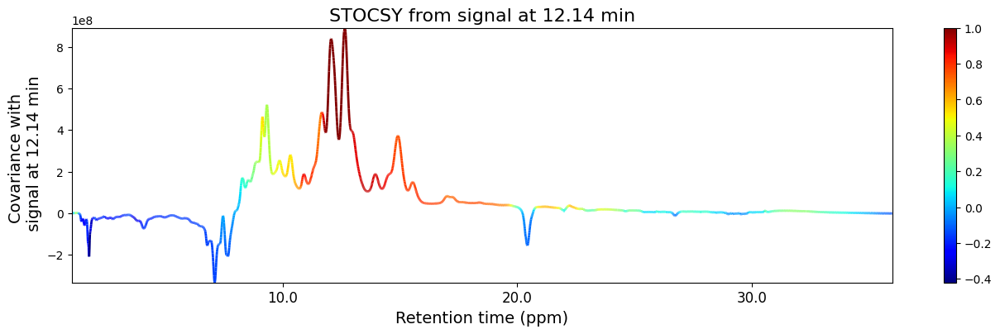

C:\Users\NPPN\Documents\pyMETAflow_HPLC\pyMetaFlow_HPLC_env\Lib\site-packages\mpld3\mplexporter\utils.py:300: MatplotlibDeprecationWarning:

The converter attribute was deprecated in Matplotlib 3.10 and will be removed in 3.12. Use get_converter and set_converter methods instead.

C:\Users\NPPN\Documents\pyMETAflow_HPLC\pyMetaFlow_HPLC_env\Lib\site-packages\mpld3\mplexporter\utils.py:303: MatplotlibDeprecationWarning:

The converter attribute was deprecated in Matplotlib 3.10 and will be removed in 3.12. Use get_converter and set_converter methods instead.

C:\Users\NPPN\Documents\pyMETAflow_HPLC\pyMetaFlow_HPLC_env\Lib\site-packages\mpld3\mplexporter\utils.py:306: MatplotlibDeprecationWarning:

The converter attribute was deprecated in Matplotlib 3.10 and will be removed in 3.12. Use get_converter and set_converter methods instead.

C:\Users\NPPN\Documents\pyMETAflow_HPLC\pyMetaFlow_HPLC_env\Lib\site-packages\mpld3\mplexporter\utils.py:300: MatplotlibDeprecationWarning:

The converter

(array([ 0.13959936,  0.19347077,  0.09526259, ..., -0.12280316,
        -0.13078882, -0.12537239], shape=(3282,)),
 0       2.406534e+05
 1       2.786905e+05
 2       1.490806e+05
 3       2.841691e+04
 4       2.688451e+05
             ...     
 3277   -1.457428e+06
 3278   -1.509641e+06
 3279   -1.394459e+06
 3280   -1.478303e+06
 3281   -1.416140e+06
 Name: 1044, Length: 3282, dtype: float64)

<Figure size 640x480 with 0 Axes>

In [23]:
dp.STOCSY_LC(selected_rt, # target in ppm
               aligned_df.drop(columns='RT(min)'), # data (without axis)
               aligned_df['RT(min)']) # axis

## Data Transformation: Normalization and Scaling

In [24]:
# Log transformation (make sure the data has only positive values)
log_transformed_data = dp.log_transform(aligned_df)

# Square root transformation (make sure the data is non-negative)
sqrt_transformed_data = dp.sqrt_transform(aligned_df)

# Cube root transformation (can handle both positive and negative values)
cbrt_transformed_data = dp.cbrt_transform(aligned_df)

The transformation method in use is: NONE


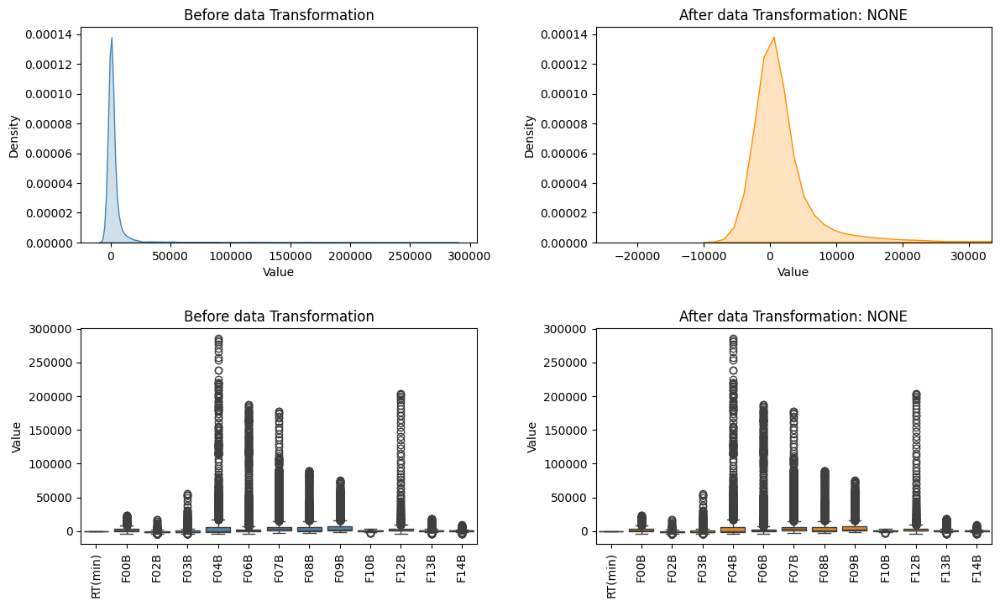

In [25]:
transformation_methods = {
    "LOG": log_transformed_data,
    "SQRT": sqrt_transformed_data,
    "CUBERT": cbrt_transformed_data,
    "NONE": aligned_df}

# User must choose the best transformation method
transformation_method = "NONE"

transformed_data = transformation_methods[transformation_method]
print(f"The transformation method in use is: {transformation_method}")

dp.compare_normalization_plots(
    before_df= aligned_df,
    after_df= transformed_data,
    sample_limit=50,
    exclude_columns=["Chemical Shift (ppm)"],
    title_before="Before data Transformation",
    title_after=f"After data Transformation: {transformation_method}",
    zoom_in_std=2)

### Normalization

    1. Z-score
    2. PQN (Probabilistic Quotient Normalization)
    3. Standard deviation normalization
    4. Median normalization

In [26]:
# Normalization functions
# Z-score normalization (no columns to exclude)
z_normalized_df = dp.z_score_normalize(transformed_data, exclude_columns="RT(min)")

# Control-based normalization with a specified control column
#control_normalized_df = dp.normalize_by_control(transformed_data, control_column="MATE_1", exclude_columns="RT(min)")

# PQN Normalization (no need to drop any columns)
pqn_normalized_df = dp.pqn_normalize(transformed_data, exclude_columns="RT(min)")

# Standard Deviation Normalization
std_dev_normalized_df = dp.std_dev_normalize(transformed_data, exclude_columns="RT(min)")

# Median Normalization (target median = 1)
median_normalized_df = dp.median_normalize(transformed_data, target_median=1.0, exclude_columns="RT(min)")

# Z_score Normalization
z_score_normalized_df = dp.z_score_normalize(transformed_data, exclude_columns="RT(min)")

print("Data Normalized.")

Data Normalized.


#### Choose your prefered normalization of the data

The Normalization method in use is: PQN


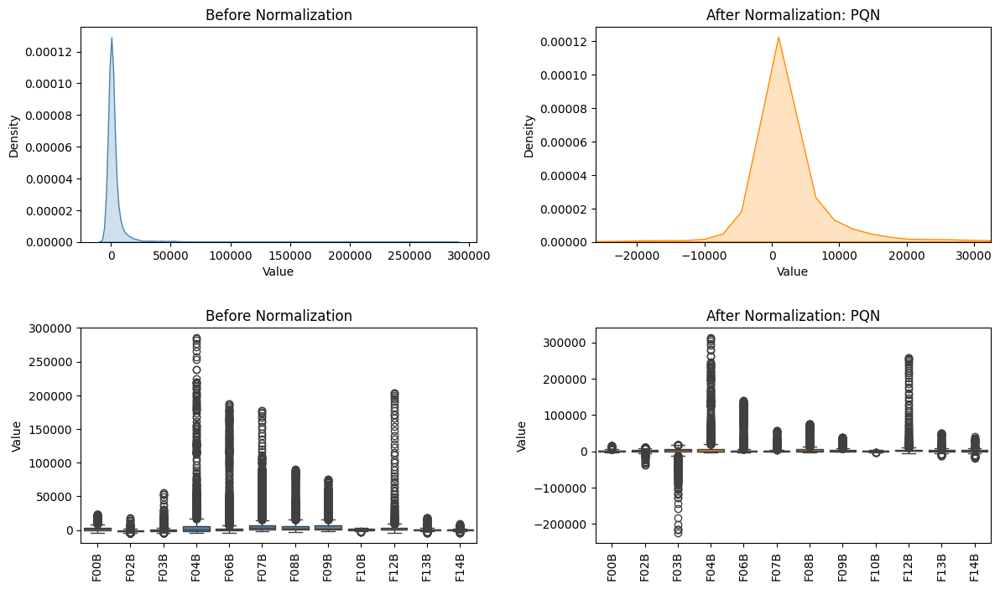

In [27]:
normalization_methods = {
    "Z_score": z_normalized_df,
#    "CONTROL": control_normalized_df,
    "PQN": pqn_normalized_df,
    "STD_DEV": std_dev_normalized_df,
    "MEDIAN": median_normalized_df,
    "NONE": transformed_data}

# User must choose the best normalization method
normalization_method = "PQN"

normalized_df = normalization_methods[normalization_method]
print(f"The Normalization method in use is: {normalization_method}")

dp.compare_normalization_plots(
    before_df=transformed_data,
    after_df=normalized_df,
    sample_limit=50,
    exclude_columns=["RT(min)"],
    title_before="Before Normalization",
    title_after=f"After Normalization: {normalization_method}",
    zoom_in_std=2)

In [28]:
dp.create_chromatogram_plot(normalized_df,
                         x_axis_col='RT(min)',
                         start_column=1,
                         end_column=25,
                         title='Normalized Chromatograms',
                         #xaxis_title='RT (min)',
                         #yaxis_title='Intensity',
                         #legend_title='Samples',
                         #output_dir='images',
                         output_file='Normalized_chromatogram_overlapping.html',
                         show_fig=False)

Plot saved as: images\Normalized_chromatogram_overlapping.html


### Scaling

    1. Mean-centering
    2. Auto-scaling
    3. Pareto scaling
    4. Range scaling
    5. Min-max scaling

In [29]:
# Mean Centering
mean_centered_df = dp.mean_center(normalized_df, exclude_columns=["RT(min)"])

# Auto Scaling
auto_scaled_df = dp.auto_scale(normalized_df, exclude_columns=["RT(min)"])

# Pareto Scaling
pareto_scaled_df = dp.pareto_scale(normalized_df, exclude_columns=["RT(min)"])

# Range Scaling
range_scaled_df = dp.range_scale(normalized_df, exclude_columns=["RT(min)"])

# Min_Max Scaling
min_max_scaled_df = dp.min_max_scale(normalized_df, 0, 1, exclude_columns=["RT(min)"])

#### Choose your prefered scaling of the data

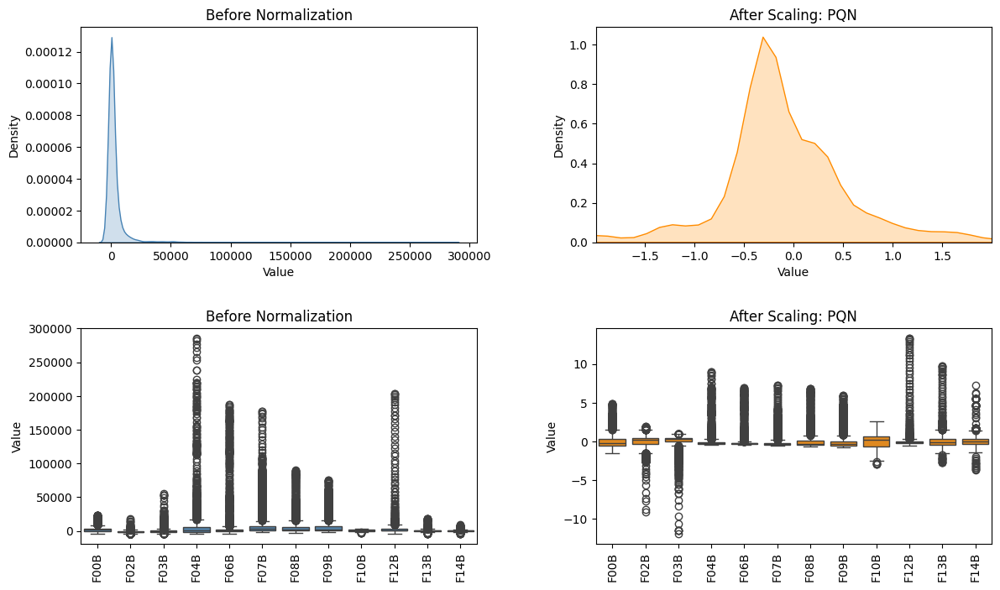

In [30]:
scale_methods = {
    "MEAN_CENTERED": mean_centered_df,
    "AUTO": auto_scaled_df,
    "PARETO": pareto_scaled_df,
    "RANGE": range_scaled_df,
    "Min_Max": min_max_scaled_df,
    "NONE": normalized_df}

# User must choose the best normalization method
scale_method = "AUTO"

scaled_df = scale_methods[scale_method]

dp.compare_normalization_plots(
    before_df=transformed_data,
    after_df=scaled_df,
    sample_limit=50,
    exclude_columns=["RT(min)"],
    title_before="Before Normalization",
    title_after=f"After Scaling: {normalization_method}",
    zoom_in_std=2)

In [31]:
# Plot data distribuition (Scaling Check after)
os.makedirs('images', exist_ok=True)
dp.plot_histogram_with_distribution(scaled_df, 
                                    output_dir='images', 
                                    file_name='histogram_with_distribution_curve_Scaled.html',
                                   #log_scale=True,
                                   x_range=(-10, 10))

In [32]:
dp.create_chromatogram_plot(scaled_df,
                         x_axis_col='RT(min)',
                         start_column=1,
                         end_column=25,
                         title='Normalized Chromatograms',
                         #xaxis_title='RT (min)',
                         #yaxis_title='Intensity',
                         #legend_title='Samples',
                         #output_dir='images',
                         output_file='Scaled_chromatogram_overlapping.html',
                         show_fig=False)

Plot saved as: images\Scaled_chromatogram_overlapping.html


---
### Overview

In [33]:
if __name__ == "__main__":
    dp.print_data_processing_report(
        start_rt,
        end_rt,
        samples_to_remove,
        transformation_method,
        aligned_method,
        normalization_method,
        scale_method)

Data-Processing Overview
----------------------
1. Unwanted outer RT regions removed: 1–36 min
2. Removed samples: None
3. Alignment method: NONE
4. Transformation method: ICOSHIFT
5. Normalization method: PQN
6. Scaling method: AUTO


---
## Data Analysis


### Principal Component Analysis (PCA)

1. Performs PCA and saves PCA score plots.
2. Creates loading plots to understand which variables drive principal components.

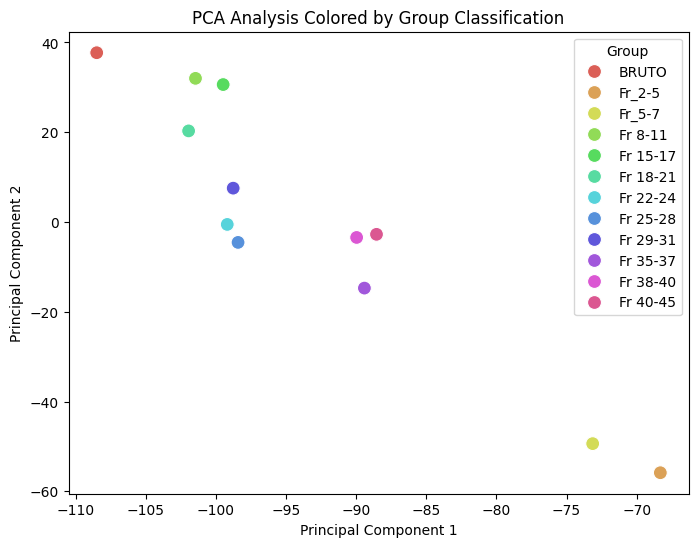

In [34]:
pca_model, pca_scores_df = dp.pca_plot(
    normalized_df=scaled_df,
    df_metadata=df_metadata,
    sample_id_col='HPLC_filename',
    classification_col='ATTRIBUTE_classification',
    n_components=2,
    palette='hls',
    figsize=(8,6),
    show_fig=True)

In [35]:
pca_model, scores_df, explained_variance = dp.perform_pca_analysis(
     data=normalized_df,  # normalized_df with samples as columns
     pc_x=1,
     pc_y=2,
     n_components=None,          # Let the function determine the optimal number based on variance_threshold
     variance_threshold=90,
     metadata=df_metadata,       # Provide the metadata DataFrame
     color_column="ATTRIBUTE_classification",  # Use this column for color coding
     sample_id_col="HPLC_filename",
     output_dir='images',
     score_plot_filename="PCA_Score_Plot.html",
     ev_plot_filename="PCA_Explained_Variance.html",
     show_fig=False)

In [36]:
# To customize the output file and directory:
fig = dp.plot_pca_loadings(normalized_df, pca_model, 
                        PC_choose=2,  # Choose the PC to plot the Loadings
                        output_dir='images', 
                        output_file='PCA_loading_plot.html',
                        show_fig=False)

Plot saved as: images\PCA_loading_plot.html


#### Partial Least Squares Discriminant Analysis (PLS-DA)

1. Performs supervised classification using PLS-DA.
2. Evaluates PLS-DA models using Q² and R² scores.
3. Plots loadings to visualize the most important variables.

In [37]:
pls_model, scores_df = dp.perform_pls_da(
    data=normalized_df,                # Your normalized LC data with samples as columns; includes "RT(min)" which will be dropped.
    metadata=df_metadata,              # Metadata DataFrame with at least "HPLC_filename" and "ATTRIBUTE_classification"
    group_col="ATTRIBUTE_classification",  # Use this column for grouping
    sample_id_col="HPLC_filename",           # Sample IDs in metadata matching normalized_df's columns
    n_components=2,
    output_dir='images',
    score_plot_filename="PLSDA_Score_Plot.html",
    show_fig=False)

###### Validation - PLS-DA

Limiting components to 9 based on the smallest training fold (size=10).


C:\Users\NPPN\Documents\pyMETAflow_HPLC\pyMetaFlow_HPLC_env\Lib\site-packages\sklearn\cross_decomposition\_pls.py:348: UserWarning:

y residual is constant at iteration 0

C:\Users\NPPN\Documents\pyMETAflow_HPLC\pyMetaFlow_HPLC_env\Lib\site-packages\sklearn\cross_decomposition\_pls.py:348: UserWarning:

y residual is constant at iteration 0

C:\Users\NPPN\Documents\pyMETAflow_HPLC\pyMetaFlow_HPLC_env\Lib\site-packages\sklearn\cross_decomposition\_pls.py:348: UserWarning:

y residual is constant at iteration 0

C:\Users\NPPN\Documents\pyMETAflow_HPLC\pyMetaFlow_HPLC_env\Lib\site-packages\sklearn\cross_decomposition\_pls.py:348: UserWarning:

y residual is constant at iteration 0

C:\Users\NPPN\Documents\pyMETAflow_HPLC\pyMetaFlow_HPLC_env\Lib\site-packages\sklearn\cross_decomposition\_pls.py:348: UserWarning:

y residual is constant at iteration 0

C:\Users\NPPN\Documents\pyMETAflow_HPLC\pyMetaFlow_HPLC_env\Lib\site-packages\sklearn\cross_decomposition\_pls.py:348: UserWarning:

y resid

C:\Users\NPPN\Documents\pyMETAflow_HPLC\pyMetaFlow_HPLC_env\Lib\site-packages\sklearn\cross_decomposition\_pls.py:348: UserWarning:

y residual is constant at iteration 0

C:\Users\NPPN\Documents\pyMETAflow_HPLC\pyMetaFlow_HPLC_env\Lib\site-packages\sklearn\cross_decomposition\_pls.py:348: UserWarning:

y residual is constant at iteration 0

C:\Users\NPPN\Documents\pyMETAflow_HPLC\pyMetaFlow_HPLC_env\Lib\site-packages\sklearn\cross_decomposition\_pls.py:348: UserWarning:

y residual is constant at iteration 0



Combined Q²/R² Scores plot saved as: images\PLSDA_Q2_R2_Scores.png


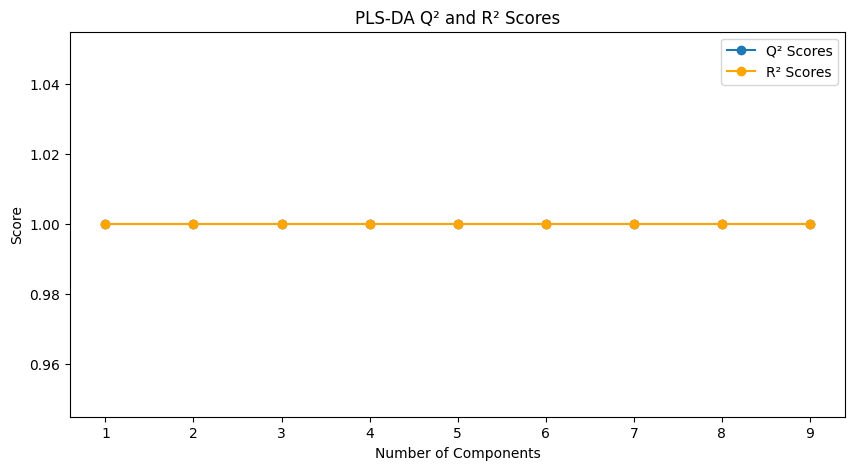

In [38]:
q2_scores, r2_scores = dp.evaluate_plsda_components(
    X=normalized_df.transpose(),
    y=df_metadata_filtered["ATTRIBUTE_classification"],
    groups=normalized_df.transpose().index,  # ensure that the sample IDs in X_eval match your labels
    n_splits=5,
    save_fig=True,
    show_fig=True,
    output_dir='images',
    output_file='PLSDA_Q2_R2_Scores.png',
    figure_size=(10, 5))

In [39]:
def plot_pls_loadings(data, pls_model, PC_choose=1, x_axis_col='RT(min)', 
                        output_dir='images', output_file=None, save_fig=True, show_fig=True):
    import os
    import plotly.graph_objects as go

    # Set a default output filename if not provided.
    if output_file is None:
        output_file = f'PLS_PC{PC_choose}_Loadings.html'
    
    # Create the Plotly figure.
    fig = go.Figure()
    
    # Convert PC_choose (1-indexed) to 0-indexed.
    comp_index = PC_choose - 1
    
    # Add a line trace using the PLS model's x_loadings_ for the selected component.
    fig.add_trace(go.Scatter(
        x=data[x_axis_col],
        y=pls_model.x_loadings_[:, comp_index],
        mode='lines',
        name=f'PLS Component {PC_choose} Loading'
    ))
    
    # Update layout with titles and labels.
    fig.update_layout(
        title=f'PLS Component {PC_choose} Loading Plot',
        xaxis_title=x_axis_col,
        yaxis_title='Loading Value',
        legend_title='Component'
    )
    
    # Save the plot if requested.
    if save_fig:
        os.makedirs(output_dir, exist_ok=True)
        output_path = os.path.join(output_dir, output_file)
        fig.write_html(output_path)
        print(f"Plot saved as: {output_path}")
    
    # Optionally display the plot.
    if show_fig:
        fig.show()
    
    return fig


In [40]:
pc_component = 1

fig = dp.plot_pls_loadings(normalized_df, pls_model, 
                        PC_choose=pc_component, 
                        x_axis_col='RT(min)', 
                        output_dir='images', 
                        output_file=f'PLSDA_loading_plot.html', 
                        save_fig=True, 
                        show_fig=False)

Plot saved as: images\PLSDA_loading_plot.html


#### Univariate BoxPLot Analysis

In [41]:
peaks = [12.7, 13.5, 
         22, 22.8
        ]  # Define two integration regions: 2.0-3.0 and 4.5-5.0
auc_values_df = dp.integrate_area_html_all(aligned_df, 
                             peaks, 
                             output_folder="html_images", 
                             base_filename="integration_plot")
display(auc_values_df)

Integration plot for sample 'F00B' saved as: images\html_images\integration_plot_F00B.html
Integration plot for sample 'F02B' saved as: images\html_images\integration_plot_F02B.html
Integration plot for sample 'F03B' saved as: images\html_images\integration_plot_F03B.html
Integration plot for sample 'F04B' saved as: images\html_images\integration_plot_F04B.html
Integration plot for sample 'F06B' saved as: images\html_images\integration_plot_F06B.html
Integration plot for sample 'F07B' saved as: images\html_images\integration_plot_F07B.html
Integration plot for sample 'F08B' saved as: images\html_images\integration_plot_F08B.html
Integration plot for sample 'F09B' saved as: images\html_images\integration_plot_F09B.html
Integration plot for sample 'F10B' saved as: images\html_images\integration_plot_F10B.html
Integration plot for sample 'F12B' saved as: images\html_images\integration_plot_F12B.html
Integration plot for sample 'F13B' saved as: images\html_images\integration_plot_F13B.html

,Region 1,Region 2
Sample,,
F00B,7218.343500,2011.384395
F02B,-927.350675,-979.224940
F03B,-617.292905,-461.392440
F04B,1195.036425,-99.584635
F06B,3070.570895,755.582260
F07B,12001.770800,3135.579230
F08B,23933.727315,1478.509185
F09B,28451.848065,3504.897480
F10B,2057.691670,1721.564040


In [42]:
fig = dp.plot_overlayed_chromatograms(aligned_df, 
                       peaks, 
                       output_filename="overlayed_chromatograms.html")

Overlayed chromatograms plot saved as: images\overlayed_chromatograms.html


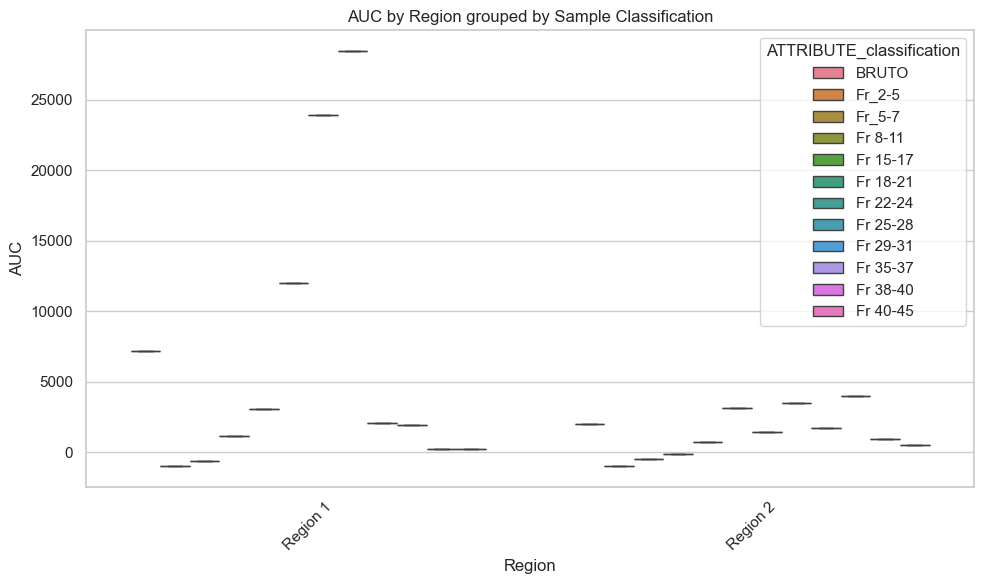

In [43]:
dp.plot_boxplots_by_class(
    auc_values_df, 
    df_metadata,
    output_folder='images', 
    filename=f'integration_boxplot_{peaks}.png',
    show_plot=True)

---
### MetaboAnalyst Format

1. Formats LC data for analysis in MetaboAnalyst.

In [44]:
metabo_df = dp.export_metaboanalyst(
    scaled_df,          # LC data with first column "RT (ppm)" and other columns as sample intensities.
    df_metadata,        # Metadata with columns "HPLC_filename" and "ATTRIBUTE_classification".
    sample_id_col="HPLC_filename",
    class_col="ATTRIBUTE_classification",
    output_file="data/MetaboAnalyst_input.csv")

MetaboAnalyst input CSV saved as: data/MetaboAnalyst_input.csv


---

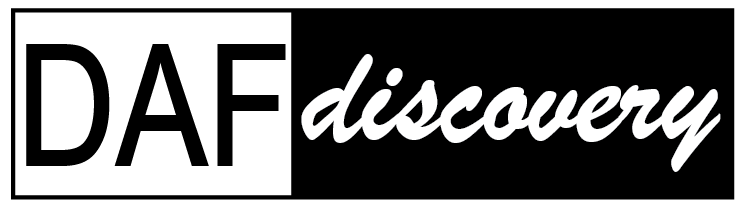

## Apply DAFdiscovery to combine BioActivity data with LC data

1. Reorders sample names based on metadata.

#### Data Fusion: Combining LC and Bioactivity Data

    1. Loads external bioactivity data (Bioact.csv).
    2. Merges it with LC data.
    3. Ensures the merged data is ordered correctly based on metadata.

#### STOCSY Analysis

    1. Uses the bioactivity data as a driver to detect correlations in the spectral data.
    2. Generates a STOCSY plot highlighting highly correlated peaks.

In [46]:
LC = normalized_df.drop(columns="RT(min)")
RT = normalized_df["RT(min)"]
    
# Bioact
BioAct = pd.read_csv('Bioact.csv', sep=';',header=0)  # assuming the BioActivity data was saved as Bioact.csv
BioActdata = BioAct.iloc[:,1:]

# Metadata ordering
Ordered_Samples = df_metadata_filtered['Samples'].values.tolist() 
Ordered_LC_filename = df_metadata_filtered['HPLC_filename'].values.tolist()
Ordered_BioAct_filename = df_metadata_filtered['BioAct_filename'].values.tolist()

# REORDERING data according to the Metadata (Ordered_Samples)
LC = LC[Ordered_LC_filename] # reorder columns according to the sampleIDs
LC.rename(columns={i:j for i,j in zip(Ordered_LC_filename,Ordered_Samples)}, inplace=True) # rename column headers as sampleIDs

BioActdata = BioActdata[Ordered_BioAct_filename] # reorder columns according to the sampleIDs
BioActdata.rename(columns={i:j for i,j in zip(Ordered_BioAct_filename,Ordered_Samples)}, inplace=True) # rename column headers as sampleIDs

# MERGE - Data from different sources has to be merged to creat a single data vector for ...
#each sample. This is the data fusion side of it.
MergeDF = pd.concat([LC,BioActdata],ignore_index=True)

# Save outside (CSV)
MergeDF = pd.DataFrame(MergeDF)

if not os.path.exists('data'):     # Rename the folder name to your specific case. Keep it organized.
    os.mkdir('data')
MergeDF.to_csv("data/MergeDF_NMR_MS_BioAct.csv", sep=',',index=False)

# expand the axis to cover both LC and MS
gap = RT.values[-1] - RT.values[-2]
start = RT.values[-1] + gap
end = start + (gap)    # considering 1 column for BioActivity
axis2 = pd.DataFrame([np.arange(start, end, gap)])
new_axis = pd.concat([RT,axis2.T], ignore_index=True)
#new_axis = new_axis[0]

print('Data from both LC and BioActivity are now MERGED and reordered according to the Matadata. We save it as a .CSV file for you')

Data from both LC and BioActivity are now MERGED and reordered according to the Matadata. We save it as a .CSV file for you


C:\Users\NPPN\AppData\Local\Temp\ipykernel_6920\1842771057.py:7: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)



<IPython.core.display.Javascript object>


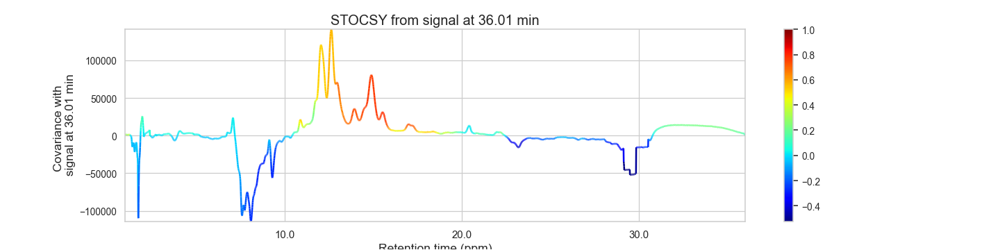

C:\Users\NPPN\Documents\pyMETAflow_HPLC\pyMetaFlow_HPLC_env\Lib\site-packages\mpld3\mplexporter\utils.py:300: MatplotlibDeprecationWarning:

The converter attribute was deprecated in Matplotlib 3.10 and will be removed in 3.12. Use get_converter and set_converter methods instead.

C:\Users\NPPN\Documents\pyMETAflow_HPLC\pyMetaFlow_HPLC_env\Lib\site-packages\mpld3\mplexporter\utils.py:303: MatplotlibDeprecationWarning:

The converter attribute was deprecated in Matplotlib 3.10 and will be removed in 3.12. Use get_converter and set_converter methods instead.

C:\Users\NPPN\Documents\pyMETAflow_HPLC\pyMetaFlow_HPLC_env\Lib\site-packages\mpld3\mplexporter\utils.py:306: MatplotlibDeprecationWarning:

The converter attribute was deprecated in Matplotlib 3.10 and will be removed in 3.12. Use get_converter and set_converter methods instead.

C:\Users\NPPN\Documents\pyMETAflow_HPLC\pyMetaFlow_HPLC_env\Lib\site-packages\mpld3\mplexporter\utils.py:300: MatplotlibDeprecationWarning:

The converter

In [47]:
# Chose driver to produce highlighted NMR spectra showing highly correlated peaks
%matplotlib notebook

# DRIVER FROM THE BIOACTIVITY DATA
driverBioAct = new_axis.values[-1] # in this case (where bioactivity is intend to be used as driver) the driver selection was design to be the BioActivity derived signal

corr, covar = dp.STOCSY_LC(float(driverBioAct), MergeDF,new_axis[0])

In [ ]:
dp.STOCSY_LC_mode(target=float(driverBioAct), 
            X=MergeDF, 
            rt_values=new_axis[0], 
            mode="linear")  # Linear 
#           mode="exponential")  # Exponencial
#           mode="sinusoidal") # Wave cycles
#           mode="sigmoid") # Saturation cases
#           mode="gaussian") # Peak shape